In [ ]:
from PIL import Image, ImageEnhance, ImageFilter

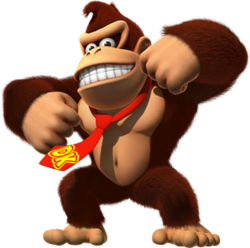

In [ ]:
img1 = Image.open("img/1.png")
img1

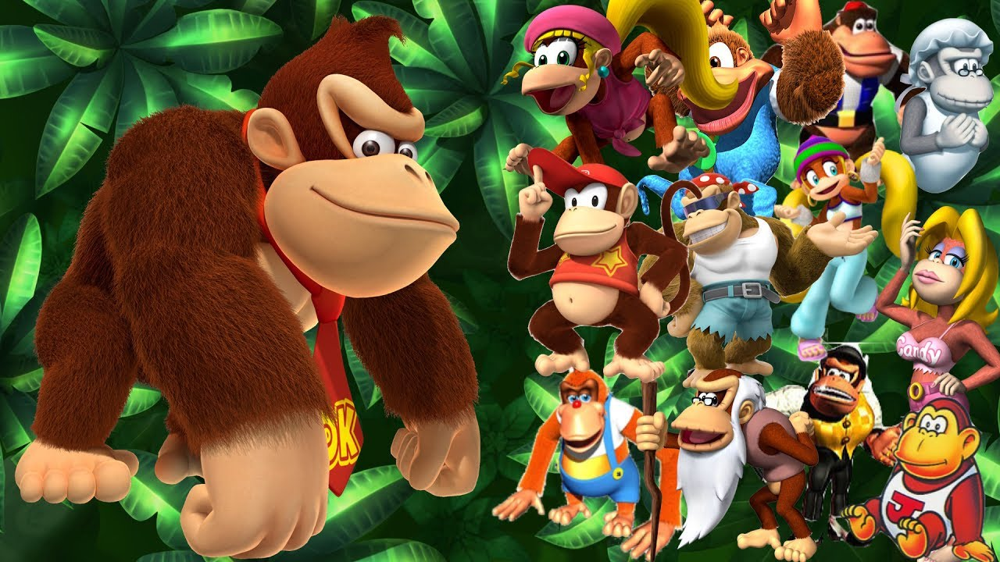

In [ ]:
img2 = Image.open("img/2.jpg")
img2

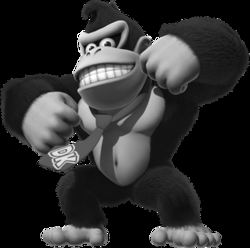

In [ ]:
gray_img = img1.convert("L")
gray_img

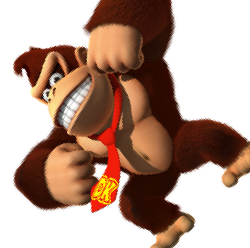

In [ ]:
rotated_img = img1.rotate(45)
rotated_img

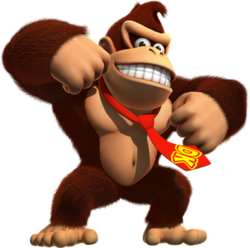

In [ ]:
transpose_img = img1.transpose(Image.FLIP_LEFT_RIGHT)
transpose_img

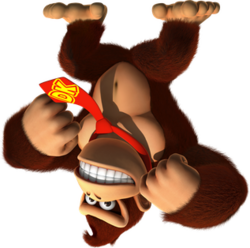

In [ ]:
transpose_img = img1.transpose(Image.FLIP_TOP_BOTTOM)
transpose_img

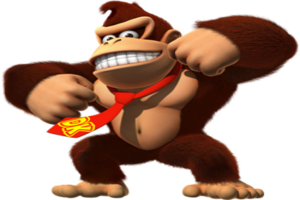

In [ ]:
resize_img_small = img1.resize((300, 200))
resize_img_small

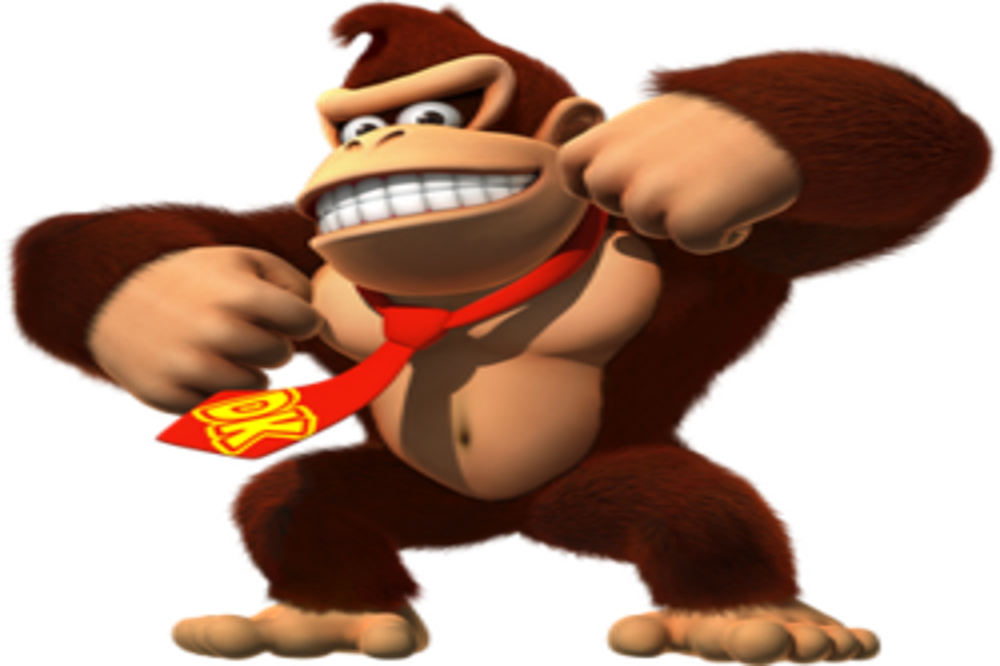

In [ ]:
resize_img_big = img1.resize((1500,1000))
resize_img_big

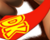

In [ ]:
dim = (50, 130, 100, 170)
crop_img = img1.crop(dim)
crop_img

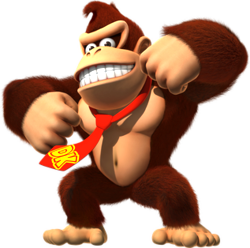

In [ ]:
enhancer = ImageEnhance.Brightness(img1)
bright_img = enhancer.enhance(1.2)
bright_img

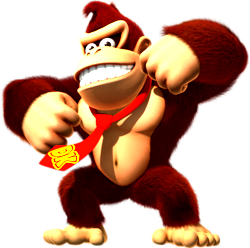

In [ ]:
enhancer = ImageEnhance.Contrast(img1)
contrast_img = enhancer.enhance(2)
contrast_img

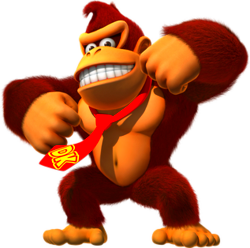

In [ ]:
enhancer = ImageEnhance.Color(img1)
saturation_img = enhancer.enhance(2)
saturation_img

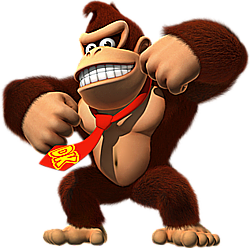

In [ ]:
enhancer = ImageEnhance.Sharpness(img1)
sharpness_img = enhancer.enhance(5)
sharpness_img

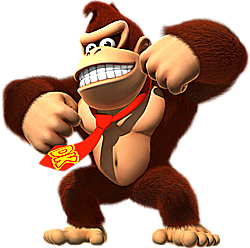

In [ ]:
teste_img = ImageEnhance.Sharpness(img1).enhance(5)
teste_img = ImageEnhance.Brightness(teste_img).enhance(1.2)
teste_img

# Filtros

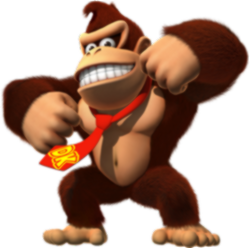

In [ ]:
filtro_smooth = img1.filter(ImageFilter.SMOOTH)
filtro_smooth

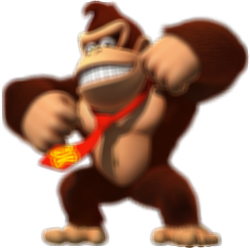

In [ ]:
filtro_blur = img1.filter(ImageFilter.BLUR)
filtro_blur

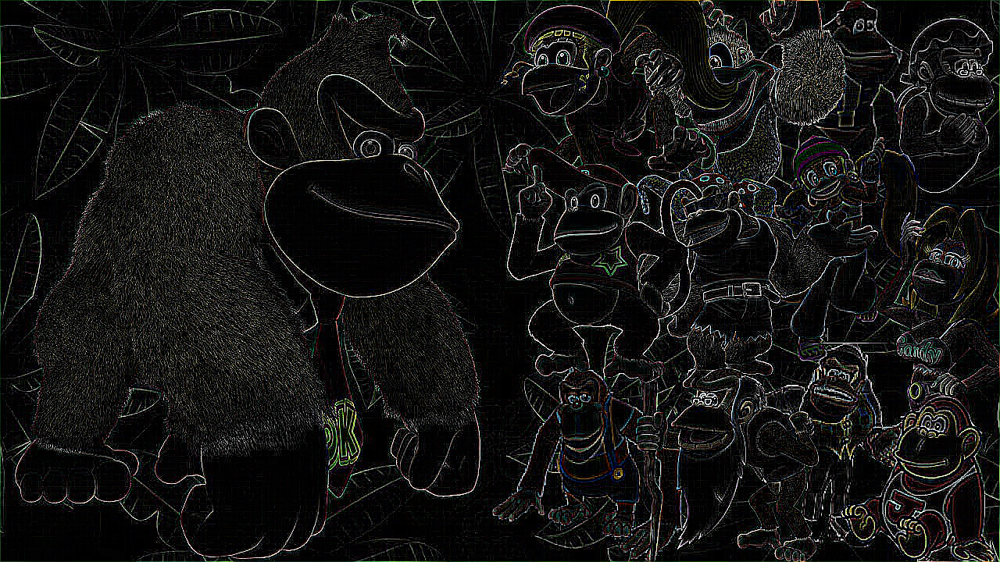

In [ ]:
filtro_edge = img2.filter(ImageFilter.FIND_EDGES)
filtro_edge

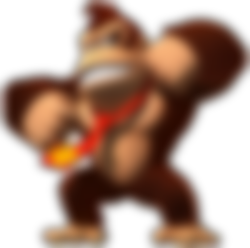

In [ ]:
filtro_gaussian_blue = img1.filter(ImageFilter.GaussianBlur(radius=5))
filtro_gaussian_blue

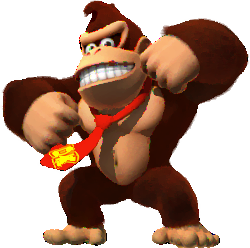

In [ ]:
paint_img = img1.filter(ImageFilter.ModeFilter(size=5))
paint_img

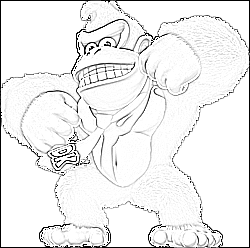

In [ ]:
pencil_img = img1.convert("L").filter(ImageFilter.CONTOUR)
pencil_img

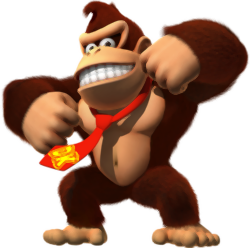

In [ ]:
denoised_img = img1.filter(ImageFilter.MedianFilter(size=3))
denoised_img

# Escrever texto em imagens

In [ ]:
from PIL import ImageDraw, ImageFont

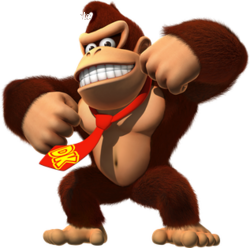

In [ ]:
text_img = img1.copy()
draw = ImageDraw.Draw(text_img)
font = ImageFont.load_default()
draw.text((10, 10), "Texto de exemplo", fill="white", font=font)
text_img


## Transparência

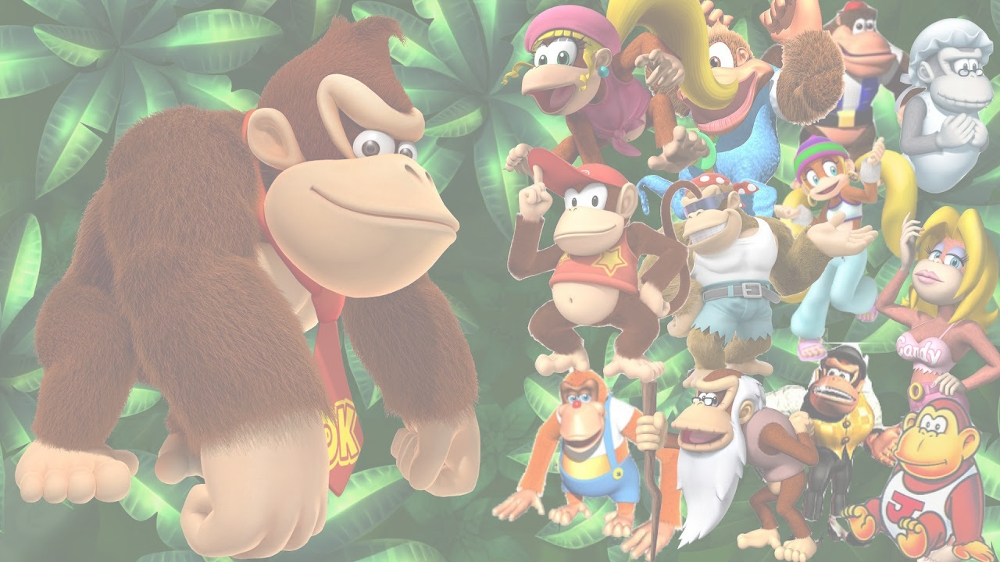

In [ ]:
rgba_img = img2.convert("RGBA")
data = rgba_img.getdata()

new_data=[]
for item in data:
    new_data.append((item[0], item[1], item[2], 128))
    
rgba_img.putdata(new_data)
rgba_img

In [ ]:
import numpy as np

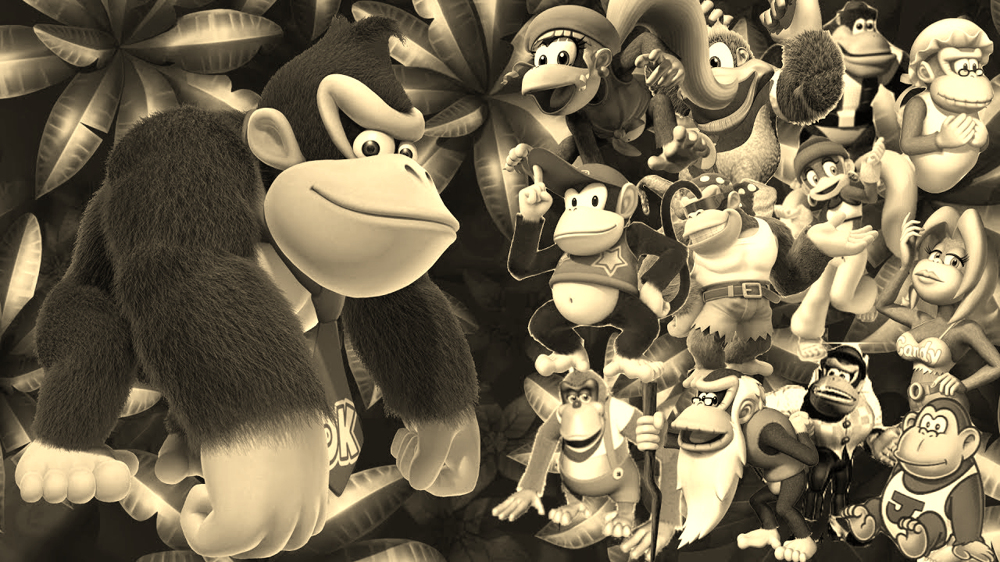

In [ ]:
def apply_sepia(img):
    sepia_img = img.convert('RGB')
    width, height = img.size
    pixels = sepia_img.load()
    
    for py in range(height):
        for px in range(width):
            r, g, b = pixels[px, py]
            tr = int(0.393 * r + 0.769 * g + 0.189 * b)
            tg = int(0.349 * r + 0.686 * g + 0.168 * b)
            tb = int(0.272 * r + 0.524 * g + 0.131 * b)
            
            tr = min(255, tr)
            tg = min(255, tg)
            tb = min(255, tb)
            
            pixels[px, py] = (tr, tg, tb)
    return sepia_img

sepia_img = apply_sepia(img2)
sepia_img

In [ ]:
mask = Image.new('L', img1.size, 0)
draw = ImageDraw.Draw(mask)
draw.ellipse((100, 100, 300, 300), fill=255)
masked_img = Image.composite(img1, Image.new('RGB', img1.size, (0, 0, 0)), mask)
masked_img